In [1]:
import numpy as np
import sympy as sp
import plotly.graph_objects as go

In [40]:
def solve_sym(W0, Y0):
    a1, a2, w = sp.symbols('a_1 a_2 w', positive=True)
    
    Wa = a1*1j*w / ((a2*1j*w + 1)**2)
    Wa0 = Wa.subs(w, W0)
    eq0 = sp.simplify(abs(Wa0)) - Y0
    Wa1 = Wa.subs(w,1000)
    eq1 = sp.simplify(abs(Wa1)) - 0.011
    sol = sp.solve([eq0, eq1], a1, a2)
    
    return float(sol[0][0]), float(sol[0][1])

In [6]:
w = np.linspace(10**-2, 10**3, 1000)
taus = np.linspace(0.2, 0.25, 10)
hs = np.linspace(0.01, 0.005, 10)
deltas = [(np.exp(-h*1j*w) / (1j*w*tau-1)) - (5 / (1j*w-5)) for tau in taus for h in hs]

In [41]:
W0 = 2
Y0 = 0.08
a1, a2 = solve_sym(W0, Y0)
Wa = a1*1j*w / ((a2*1j*w + 1)**2)
a1, a2

(0.04059024354243542, 0.06073732081859886)

In [35]:
fig = go.Figure()

for delta in deltas:
    fig.add_trace(
        go.Scatter(x=w, y=abs(delta))
    )

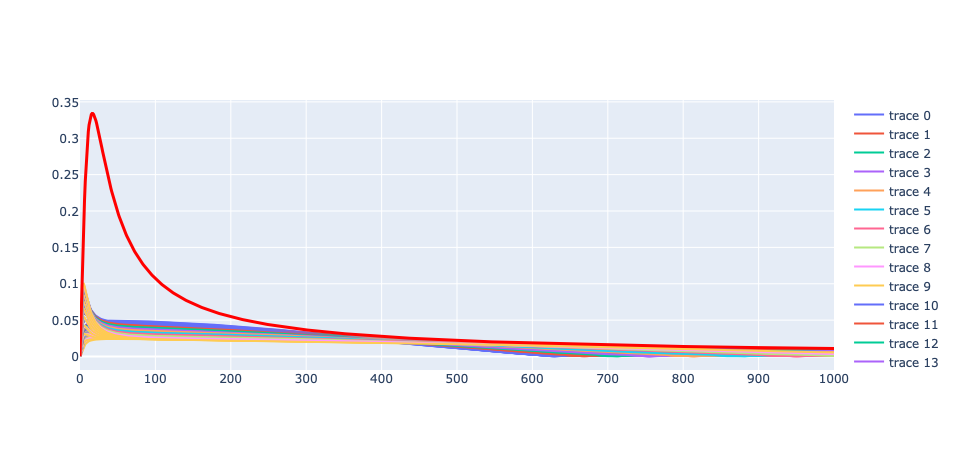

In [42]:
fig.data = fig.data[:-1]
fig.add_trace(
    go.Scatter(x=w, y=abs(Wa), name='Wa', line_width=3, line_color='Red')
)